In [ ]:
!pip install -q datasets diffusers transformers accelerate torchmetrics[image]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 20.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.7/265.7 kB 19.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 806.1/806.1 kB 27.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 15.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 20.8 MB/s eta 0:00:00


In [ ]:
import time

In [ ]:
from datasets import load_dataset

prompts = load_dataset("nateraw/parti-prompts", split="train")
prompts = prompts.shuffle()
sample_prompts = [prompts[i]["Prompt"] for i in range(100)]
# from diffusers import StableDiffusionPipeline
# import torch

# model_ckpt = "CompVis/stable-diffusion-v1-4"
# device = "cuda"
# weight_dtype = torch.float16
# sd_pipeline = StableDiffusionPipeline.from_pretrained(model_ckpt, torch_dtype=weight_dtype).to(device)
# Fixing these sample prompts in the interest of reproducibility.
# sample_prompts = [
#     "a corgi",
#     "a hot air balloon with a yin-yang symbol, with the moon visible in the daytime sky",
#     "a car with no windows",
#     "a cube made of porcupine",
#     'The saying "BE EXCELLENT TO EACH OTHER" written on a red brick wall with a graffiti image of a green alien wearing a tuxedo. A yellow fire hydrant is on a sidewalk in the foreground.',
# ]

In [ ]:
# sample_prompts

In [ ]:
import numpy as np

## SD v1_4

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

model_ckpt = "CompVis/stable-diffusion-v1-4"
device = "cuda"
weight_dtype = torch.float16
sd_pipeline_v14 = StableDiffusionPipeline.from_pretrained(model_ckpt, torch_dtype=weight_dtype).to(device)
sd_pipeline_v14.safety_checker = lambda images, clip_input: (images, None)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
#generate images with sample prompts
seed = 0
generator = torch.manual_seed(seed)

In [ ]:
#generate images with sample prompts
seed = 0
generator = torch.manual_seed(seed)
image_1_4 = np.random.rand(5, 512, 512, 3)
start = time.time_ns()
for i in range(len(sample_prompts)//5):
    # print(sample_prompts[i])
    images = sd_pipeline_v14(
        sample_prompts[i:i+5], num_images_per_prompt=1, generator=generator, output_type="numpy"
    ).images
    image_1_4 = np.concatenate((image_1_4, images), axis=0)
end = time.time_ns()
original_sd = f"{(end - start) / 1e6:.1f}"
print(f"Execution time -- {original_sd} ms\n")
image_1_4 = image_1_4[5:]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/image_processor.py:385: FutureWarning: the output_type numpy is outdated and has been set to `np`. Please make sure to set it to one of these instead: `pil`, `np`, `pt`, `latent`
  deprecate("Unsupported output_type", "1.0.0", deprecation_message, standard_warn=False)


  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time -- 220037.8 ms



In [ ]:
# combined_image = combined_image[5:]

In [ ]:
print(image_1_4.shape)

(100, 512, 512, 3)


In [ ]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)


In [ ]:
sd_clip_score_14 = calculate_clip_score(image_1_4, sample_prompts)
print(f"CLIP score: {sd_clip_score_14}")

CLIP score: 16.0307


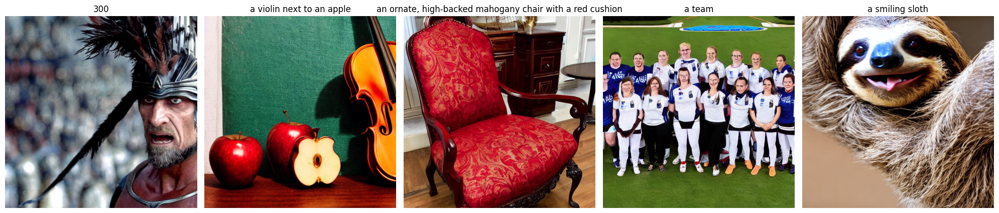

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data: Replace these with your actual data
images = image_1_4[:5]  # List of 4 random images
captions = sample_prompts[:5]  # Corresponding captions

# Number of images
num_images = len(images)

# Set up the grid layout
cols = 5  # You can change this based on your requirement
rows = num_images // cols + (num_images % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

# Loop through images and captions
for idx, (image, caption) in enumerate(zip(images, captions)):
    axes[idx].imshow(image, cmap='gray')  # or 'viridis', 'plasma', etc. based on your image data
    axes[idx].set_title(caption)
    axes[idx].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
del sd_pipeline_v14
torch.cuda.empty_cache()

In [ ]:
# def dummy(images, **kwargs):
#     return images, False
# # pipe.safety_checker = dummy

In [ ]:
# del sd_pipeline_1_5

In [ ]:
# torch.cuda.empty_cache()

## Stable Diffusion 2

In [ ]:
model_ckpt_sd2 = "stabilityai/stable-diffusion-2-base"
# model_ckpt_1_5 = "runwayml/stable-diffusion-v1-5"
sd_pipeline_2 = StableDiffusionPipeline.from_pretrained(model_ckpt_sd2, torch_dtype=weight_dtype).to(device)
# sd_pipeline_1_5.safety_checker
images_2 = np.random.rand(5, 512, 512, 3)
sd_pipeline_2.safety_checker = lambda images, clip_input: (images, None)
start = time.time_ns()
for i in tqdm(range(len(sample_prompts)//5)):
    # print(sample_prompts[i])
    images = sd_pipeline_2(sample_prompts[i:i+5],
                             num_images_per_prompt=1,
                             generator=generator,
                             output_type="numpy").images

    images_2 = np.concatenate((images_2, images), axis=0)
end = time.time_ns()
original_sd = f"{(end - start) / 1e6:.1f}"
print(f"Execution time -- {original_sd} ms\n")
images_2 = images_2[5:]
print(f"Shape for Diffusion v1-5: {images_2.shape}")

model_index.json:   0%|          | 0.00/537 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

tokenizer/special_tokens_map.json:   0%|          | 0.00/460 [00:00<?, ?B/s]

text_encoder/config.json:   0%|          | 0.00/738 [00:00<?, ?B/s]

scheduler/scheduler_config.json:   0%|          | 0.00/308 [00:00<?, ?B/s]

tokenizer/tokenizer_config.json:   0%|          | 0.00/929 [00:00<?, ?B/s]

tokenizer/merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

(…)ature_extractor/preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.36G [00:00<?, ?B/s]

tokenizer/vocab.json:   0%|          | 0.00/1.06M [00:00<?, ?B/s]

unet/config.json:   0%|          | 0.00/1.01k [00:00<?, ?B/s]

vae/config.json:   0%|          | 0.00/716 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/335M [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/3.46G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/image_processor.py:385: FutureWarning: the output_type numpy is outdated and has been set to `np`. Please make sure to set it to one of these instead: `pil`, `np`, `pt`, `latent`
  deprecate("Unsupported output_type", "1.0.0", deprecation_message, standard_warn=False)
  5%|▌         | 1/20 [00:09<03:02,  9.63s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 10%|█         | 2/20 [00:19<02:53,  9.66s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 15%|█▌        | 3/20 [00:29<02:45,  9.73s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|██        | 4/20 [00:38<02:35,  9.73s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 25%|██▌       | 5/20 [00:48<02:26,  9.75s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 30%|███       | 6/20 [00:58<02:16,  9.76s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 35%|███▌      | 7/20 [01:08<02:07,  9.79s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|████      | 8/20 [01:18<01:57,  9.80s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 45%|████▌     | 9/20 [01:27<01:47,  9.81s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|█████     | 10/20 [01:37<01:38,  9.81s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 55%|█████▌    | 11/20 [01:47<01:28,  9.81s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|██████    | 12/20 [01:57<01:18,  9.82s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 65%|██████▌   | 13/20 [02:07<01:08,  9.83s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 70%|███████   | 14/20 [02:17<00:59,  9.85s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 75%|███████▌  | 15/20 [02:27<00:49,  9.86s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|████████  | 16/20 [02:36<00:39,  9.87s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 85%|████████▌ | 17/20 [02:46<00:29,  9.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 90%|█████████ | 18/20 [02:56<00:19,  9.90s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 95%|█████████▌| 19/20 [03:06<00:09,  9.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 20/20 [03:16<00:00,  9.83s/it]

Execution time -- 196686.5 ms

Shape for Diffusion v1-5: (100, 512, 512, 3)


In [ ]:
sd_clip_score_2 = calculate_clip_score(images_2,sample_prompts)
print(f"CLIP Score with v-1-5: {sd_clip_score_2}")

CLIP Score with v-1-5: 15.7573


In [ ]:
del sd_pipeline_2
torch.cuda.empty_cache()

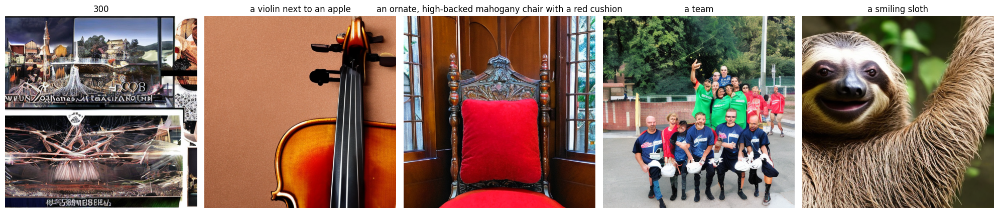

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# Sample data: Replace these with your actual data
images = images_2[:5]  # List of 4 random images
captions = sample_prompts[:5]  # Corresponding captions

# Number of images
num_images = len(images)

# Set up the grid layout
cols = 5  # You can change this based on your requirement
rows = num_images // cols + (num_images % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

# Loop through images and captions
for idx, (image, caption) in enumerate(zip(images, captions)):
    axes[idx].imshow(image, cmap='gray')  # or 'viridis', 'plasma', etc. based on your image data
    axes[idx].set_title(caption)
    axes[idx].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


## Stable Diffusion v1_5

In [ ]:
from tqdm import tqdm

In [ ]:
model_ckpt_1_5 = "runwayml/stable-diffusion-v1-5"
sd_pipeline_1_5 = StableDiffusionPipeline.from_pretrained(model_ckpt_1_5, torch_dtype=weight_dtype).to(device)
# sd_pipeline_1_5.safety_checker
images_1_5 = np.random.rand(5, 512, 512, 3)
sd_pipeline_1_5.safety_checker = lambda images, clip_input: (images, None)
start = time.time_ns()
for i in tqdm(range(len(sample_prompts)//5)):
    # print(sample_prompts[i])
    images = sd_pipeline_1_5(sample_prompts[i:i+5],
                             num_images_per_prompt=1,
                             generator=generator,
                             output_type="numpy").images

    images_1_5 = np.concatenate((images_1_5, images), axis=0)
end = time.time_ns()
original_sd = f"{(end - start) / 1e6:.1f}"
print(f"Execution time -- {original_sd} ms\n")
images_1_5 = images_1_5[5:]
print(f"Shape for Diffusion v1-5: {images_1_5.shape}")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/diffusers/image_processor.py:385: FutureWarning: the output_type numpy is outdated and has been set to `np`. Please make sure to set it to one of these instead: `pil`, `np`, `pt`, `latent`
  deprecate("Unsupported output_type", "1.0.0", deprecation_message, standard_warn=False)
  5%|▌         | 1/20 [00:10<03:24, 10.76s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 10%|█         | 2/20 [00:21<03:16, 10.89s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 15%|█▌        | 3/20 [00:32<03:04, 10.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 20%|██        | 4/20 [00:43<02:54, 10.88s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 25%|██▌       | 5/20 [00:54<02:43, 10.91s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 30%|███       | 6/20 [01:05<02:33, 10.94s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 35%|███▌      | 7/20 [01:16<02:22, 10.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 40%|████      | 8/20 [01:27<02:11, 10.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 45%|████▌     | 9/20 [01:38<02:00, 10.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 50%|█████     | 10/20 [01:49<01:49, 10.96s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 55%|█████▌    | 11/20 [02:00<01:38, 10.97s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 60%|██████    | 12/20 [02:11<01:27, 10.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 65%|██████▌   | 13/20 [02:22<01:16, 10.98s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 70%|███████   | 14/20 [02:33<01:05, 10.99s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 75%|███████▌  | 15/20 [02:44<00:55, 11.00s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 80%|████████  | 16/20 [02:55<00:44, 11.01s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 85%|████████▌ | 17/20 [03:06<00:33, 11.05s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 90%|█████████ | 18/20 [03:17<00:22, 11.05s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

 95%|█████████▌| 19/20 [03:28<00:11, 11.06s/it]

  0%|          | 0/50 [00:00<?, ?it/s]

100%|██████████| 20/20 [03:39<00:00, 10.99s/it]

Execution time -- 219760.3 ms

Shape for Diffusion v1-5: (100, 512, 512, 3)


In [ ]:
sd_clip_score_1_5 = calculate_clip_score(images_1_5,sample_prompts)
print(f"CLIP Score with v-1-5: {sd_clip_score_1_5}")

CLIP Score with v-1-5: 16.1051


In [ ]:
del sd_pipeline_1_5
torch.cuda.empty_cache()

In [ ]:
from matplotlib import pyplot as plt

In [ ]:
#create a image plot for

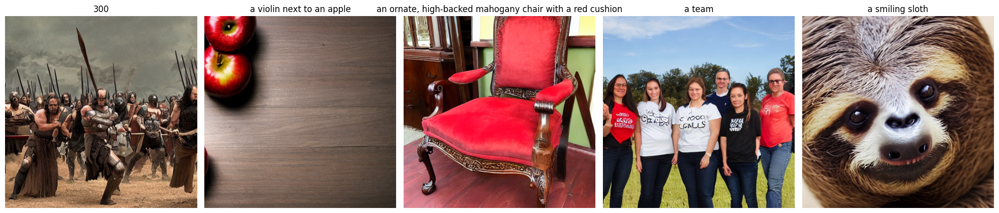

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# Sample data: Replace these with your actual data
images = images_1_5[:5]  # List of 4 random images
captions = sample_prompts[:5]  # Corresponding captions

# Number of images
num_images = len(images)

# Set up the grid layout
cols = 5  # You can change this based on your requirement
rows = num_images // cols + (num_images % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

# Loop through images and captions
for idx, (image, caption) in enumerate(zip(images, captions)):
    axes[idx].imshow(image, cmap='gray')  # or 'viridis', 'plasma', etc. based on your image data
    axes[idx].set_title(caption)
    axes[idx].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


## Distilled Base

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

distilled_base = StableDiffusionPipeline.from_pretrained(
    "nota-ai/bk-sdm-base", torch_dtype=torch.float16, use_safetensors=True,
).to("cuda")

distilled_base.safety_checker = lambda images, clip_input: (images, None)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
images_distilled_base = np.random.rand(5, 512, 512, 3)
# sd_pipeline_1_5.safety_checker = lambda images, clip_input: (images, None)
start = time.time_ns()
for i in range(len(sample_prompts)//5):
    # print(sample_prompts[i])
    images = distilled_base(sample_prompts[i:i+5],
                             num_images_per_prompt=1,
                             generator=generator,
                             output_type="numpy").images

    images_distilled_base = np.concatenate((images_distilled_base, images), axis=0)
end = time.time_ns()

original_sd = f"{(end - start) / 1e6:.1f}"
print(f"Execution time -- {original_sd} ms\n")
images_distilled_base = images_distilled_base[5:]
print(f"Shape for Diffusion BK SDM base: {images_distilled_base.shape}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time -- 145611.1 ms

Shape for Diffusion BK SDM base: (100, 512, 512, 3)


In [ ]:
sd_clip_score_distilled_base = calculate_clip_score(images_distilled_base,sample_prompts)
print(f"CLIP Score with bk sdm distilled base: {sd_clip_score_distilled_base}")

CLIP Score with bk sdm distilled base: 16.188


In [ ]:
# ' '.join(caption.split()[:10])

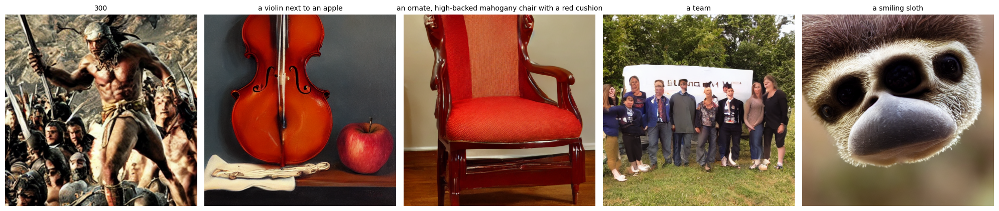

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data: Replace these with your actual data
images = images_distilled_base[:5] # List of 4 random images
captions = sample_prompts[:5] # Corresponding captions

# Number of images
num_images = len(images)

# Set up the grid layout
cols = 5  # You can change this based on your requirement
rows = num_images // cols + (num_images % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

# Loop through images and captions
for idx, (image, caption) in enumerate(zip(images, captions)):
    axes[idx].imshow(image, cmap='gray')  # or 'viridis', 'plasma', etc. based on your image data
    axes[idx].set_title(' '.join(caption.split()[:10]), fontsize=10)
    axes[idx].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
del distilled_base
torch.cuda.empty_cache()

## Distilled Small

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

distilled_small = StableDiffusionPipeline.from_pretrained(
    "nota-ai/bk-sdm-small", torch_dtype=torch.float16, use_safetensors=True,
).to("cuda")

distilled_small.safety_checker = lambda images, clip_input: (images, None)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
images_distilled_small = np.random.rand(5, 512, 512, 3)
# sd_pipeline_1_5.safety_checker = lambda images, clip_input: (images, None)
start = time.time_ns()
for i in range(len(sample_prompts)//5):
    # print(sample_prompts[i])
    images = distilled_small(sample_prompts[i:i+5],
                             num_images_per_prompt=1,
                             generator=generator,
                             output_type="numpy").images

    images_distilled_small = np.concatenate((images_distilled_small, images), axis=0)
end = time.time_ns()

original_sd = f"{(end - start) / 1e6:.1f}"
print(f"Execution time (Small)-- {original_sd} ms\n")
images_distilled_small = images_distilled_small[5:]
print(f"Shape for Diffusion BK SDM small: {images_distilled_small.shape}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time (Small)-- 142314.4 ms

Shape for Diffusion BK SDM small: (100, 512, 512, 3)


In [ ]:
sd_clip_score_distilled_small = calculate_clip_score(images_distilled_small, sample_prompts)
print(f"CLIP Score with bk sdm distilled small: {sd_clip_score_distilled_small}")

CLIP Score with bk sdm distilled small: 16.1998


In [ ]:
# ' '.join(caption.split()[:10])

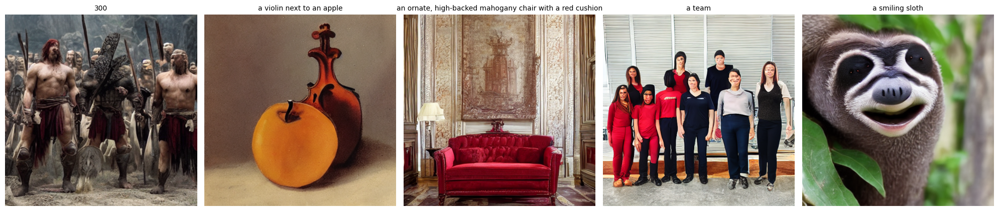

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data: Replace these with your actual data
images = images_distilled_small[:5] # List of 4 random images
captions = sample_prompts[:5] # Corresponding captions

# Number of images
num_images = len(images)

# Set up the grid layout
cols = 5  # You can change this based on your requirement
rows = num_images // cols + (num_images % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

# Loop through images and captions
for idx, (image, caption) in enumerate(zip(images, captions)):
    axes[idx].imshow(image, cmap='gray')  # or 'viridis', 'plasma', etc. based on your image data
    axes[idx].set_title(' '.join(caption.split()[:10]), fontsize=10)
    axes[idx].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
del distilled_small
torch.cuda.empty_cache()

## Distilled Tiny

In [ ]:
from diffusers import StableDiffusionPipeline
import torch

distilled_tiny = StableDiffusionPipeline.from_pretrained(
    "nota-ai/bk-sdm-tiny", torch_dtype=torch.float16, use_safetensors=True,
).to("cuda")

distilled_tiny.safety_checker = lambda images, clip_input: (images, None)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.


In [ ]:
images_distilled_tiny = np.random.rand(5, 512, 512, 3)
# sd_pipeline_1_5.safety_checker = lambda images, clip_input: (images, None)
start = time.time_ns()
for i in range(len(sample_prompts)//5):
    # print(sample_prompts[i])
    images = distilled_tiny(sample_prompts[i:i+5],
                             num_images_per_prompt=1,
                             generator=generator,
                             output_type="numpy").images

    images_distilled_tiny = np.concatenate((images_distilled_tiny, images), axis=0)
end = time.time_ns()

original_sd = f"{(end - start) / 1e6:.1f}"
print(f"Execution time -- {original_sd} ms\n")
images_distilled_tiny = images_distilled_tiny[5:]
print(f"Shape for Diffusion BK SDM tiny: {images_distilled_tiny.shape}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Execution time -- 136107.2 ms

Shape for Diffusion BK SDM tiny: (100, 512, 512, 3)


In [ ]:
sd_clip_score_distilled_tiny = calculate_clip_score(images_distilled_tiny,sample_prompts)
print(f"CLIP Score with bk sdm distilled: {sd_clip_score_distilled_tiny}")

CLIP Score with bk sdm distilled: 16.7586


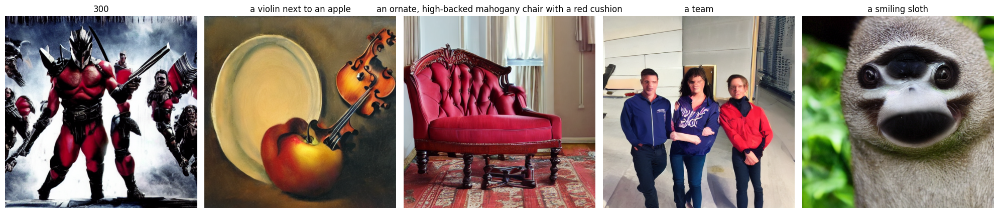

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data: Replace these with your actual data
images = images_distilled_tiny[:5]  # List of 4 random images
captions = sample_prompts[:5]  # Corresponding captions

# Number of images
num_images = len(images)

# Set up the grid layout
cols = 5  # You can change this based on your requirement
rows = num_images // cols + (num_images % cols > 0)

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

# Loop through images and captions
for idx, (image, caption) in enumerate(zip(images, captions)):
    axes[idx].imshow(image, cmap='gray')  # or 'viridis', 'plasma', etc. based on your image data
    axes[idx].set_title(caption)
    axes[idx].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()


In [ ]:
del distilled_tiny
torch.cuda.empty_cache()

# Results

In [ ]:
clip_score_dict= {
    "stable_diffusion_v1_4": sd_clip_score_14,
    "stable_diffusion_v1_5": sd_clip_score_1_5,
    "distilled_tiny": sd_clip_score_distilled_tiny,
    "distilled_small": sd_clip_score_distilled_small,
    "distilled_base": sd_clip_score_distilled_base,
}
clip_score_dict

{'stable_diffusion_v1_4': 16.0307,
 'stable_diffusion_v1_5': 16.1051,
 'distilled_tiny': 16.7586,
 'distilled_small': 16.1998,
 'distilled_base': 16.188}

In [ ]:
{'stable_diffusion_v1_4': 220037.8,
 'stable_diffusion_v1_5': 219760.3,
 'distilled_tiny': 136107.2,
 'distilled_small': 142314.4,
 'distilled_base': 145611.1}